# The Dataset

## Description

The following acoustic properties of each voice are measured and included within the CSV:

- *meanfreq*: mean frequency (in kHz)
- *sd*: standard deviation of frequency
- *median*: median frequency (in kHz)
- *Q25*: first quantile (in kHz)
- *Q75*: third quantile (in kHz)
- *IQR*: interquantile range (in kHz)
- *skew*: skewness (see note in specprop description)
- *kurt*: kurtosis (see note in specprop description)
- *sp.ent*: spectral entropy
- *sfm*: spectral flatness
- *mode*: mode frequency
- *centroid*: frequency centroid (see specprop)
- *peakf*: peak frequency (frequency with highest energy)
- *meanfun*: average of fundamental frequency measured across acoustic signal
- *minfun*: minimum fundamental frequency measured across acoustic signal
- *maxfun*: maximum fundamental frequency measured across acoustic signal
- *meandom*: average of dominant frequency measured across acoustic signal
- *mindom*: minimum of dominant frequency measured across acoustic signal
- *maxdom*: maximum of dominant frequency measured across acoustic signal
- *dfrange*: range of dominant frequency measured across acoustic signal
- *modindx*: modulation index. Calculated as the accumulated absolute difference between adjacent measurements of fundamental frequencies divided by the frequency range
- *label*: male or female

## Accuracy of various ML methods

Baseline (always predict male):
50% / 50%

Logistic Regression:
97% / 98%

CART:
96% / 97%

Random Forest:
100% / 98%

SVM:
100% / 99%

XGBoost:
100% / 99%

## My aims

My aim is to build a model predicting *label* in the best way

What are the most important features that differ between male and female voices?

## Imports

In [45]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=1)

## Read the data

In [2]:
data = pd.read_csv('voice.csv')
data.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [3]:
data.columns

Index(['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx', 'label'],
      dtype='object')

## Descriptive stats

In [4]:
data.describe()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,0.165282,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,0.077203,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,0.118016,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,0.186599,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,0.221104,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


Is *label* balanced?

In [5]:
data.describe(include=['O'])

,label
count,3168
unique,2
top,male
freq,1584


## NaN values

In [6]:
data.isnull().sum()

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

# EDA & Preprocessing

## Pairplot

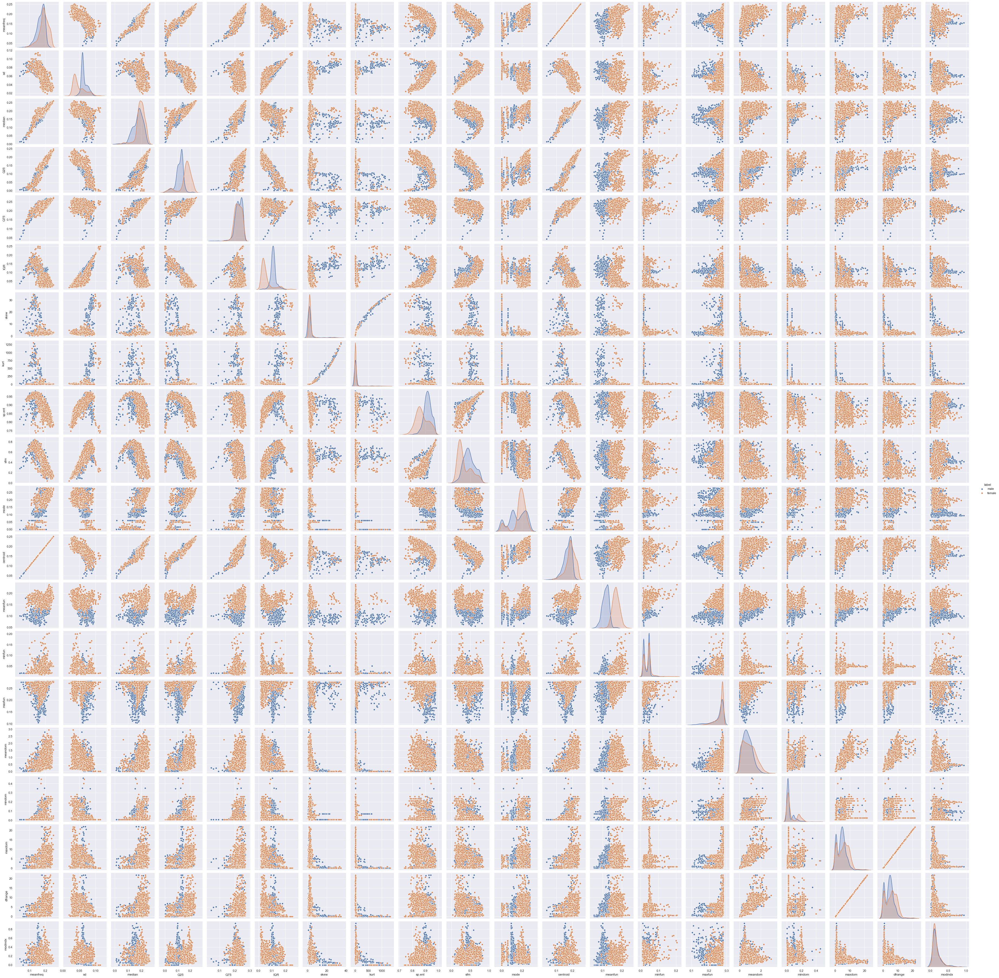

In [7]:
pp = sns.pairplot(data, hue='label')
plt.show(pp)

In [8]:
pp.savefig('voice_pairs.png')

## Correlations heatmap

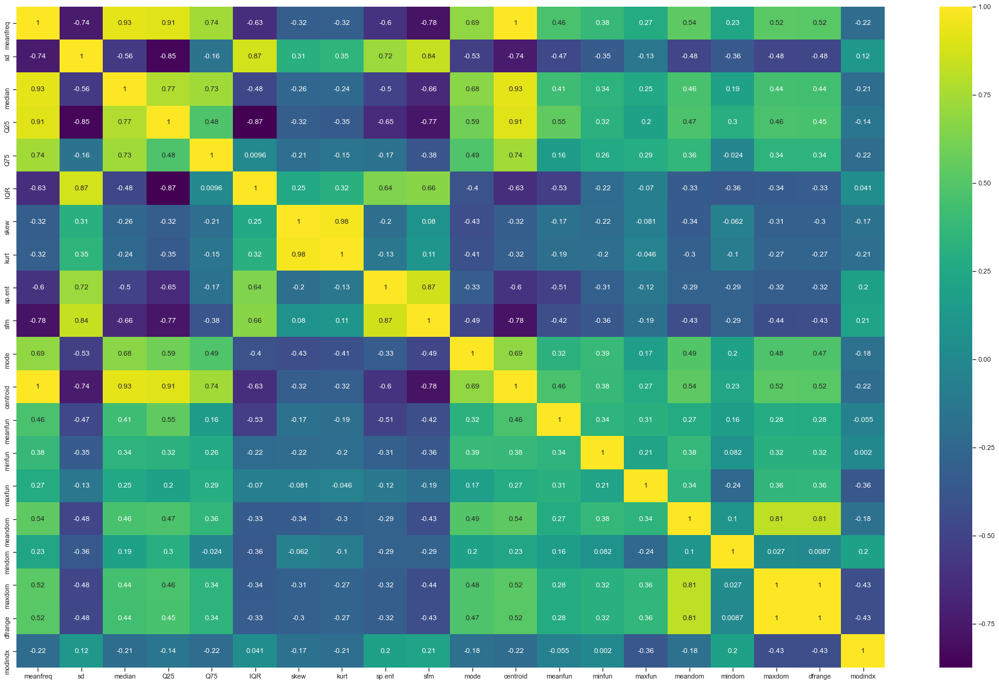

In [9]:
corr = data.drop(['label'], axis=1).corr(method='pearson')
plt.figure(figsize=(32, 20))
sns.set_style('ticks')
cp = sns.heatmap(corr, cmap='viridis', annot=True)
cp.figure.savefig('heatmap_corr_spearman.png')
plt.show(cp)

### Zoom in some pairs

#### The first 8 variables describe distribution of voices' frequencies, they seem to be correlated

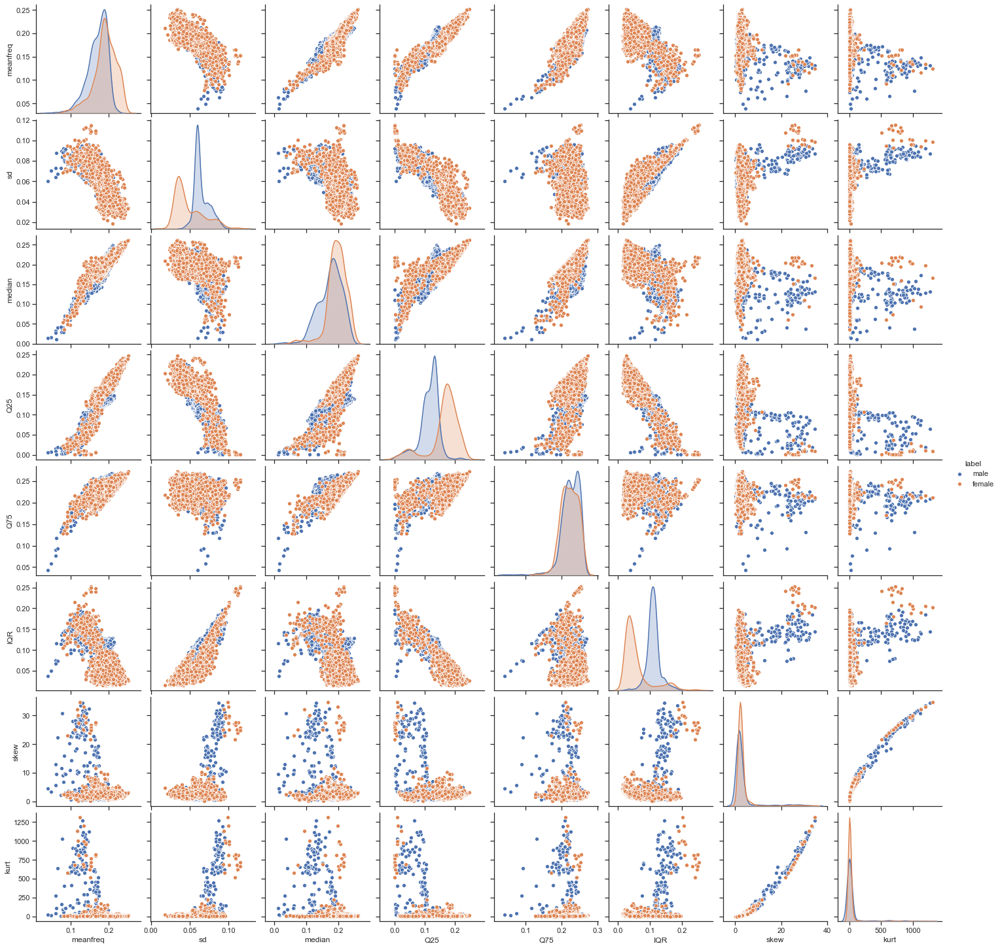

In [10]:
chars1 = ['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt', 'label']
sns.pairplot(data[chars1], hue='label')

<AxesSubplot:>

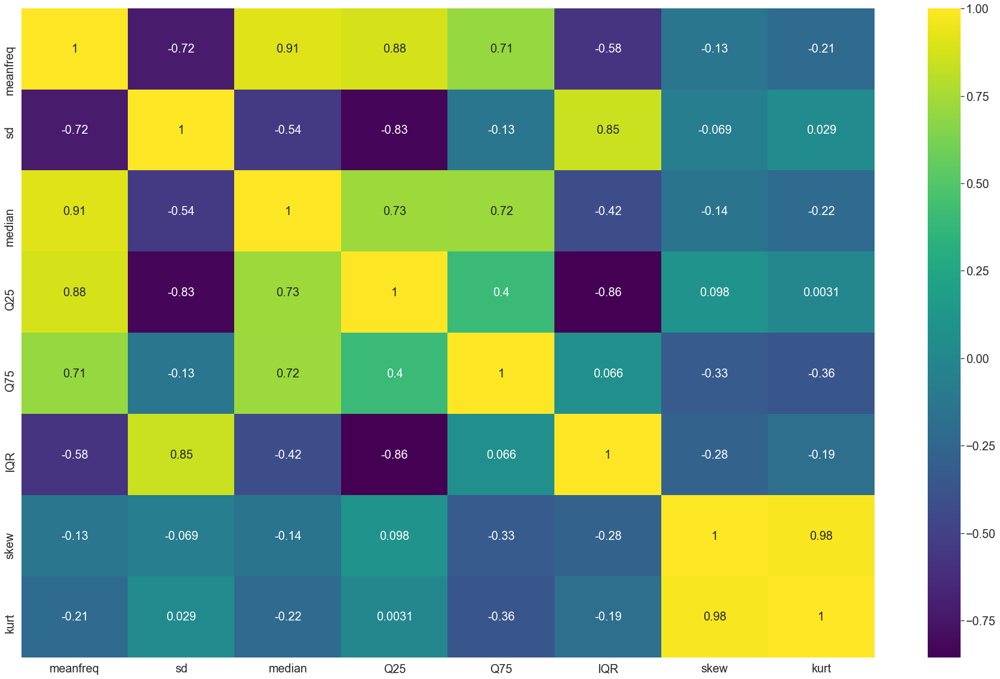

In [11]:
corr = data[chars1].corr(method='spearman')
plt.figure(figsize=(32, 20))
#sns.set_style('ticks')
sns.heatmap(corr, cmap='viridis', annot=True, annot_kws={"size": 20})

- mean nd median freq are correlated (as was expected) + SD, Q25, Q75, IQR
- SD and median, Q25, IQR
- skew and kurtosis (as expected)

So we can drop skew, median, SD, Q25, Q75 and IQR

At the same time IQR, SD and Q25 seem to predict gender quite well

#### The next group of voice characteristics

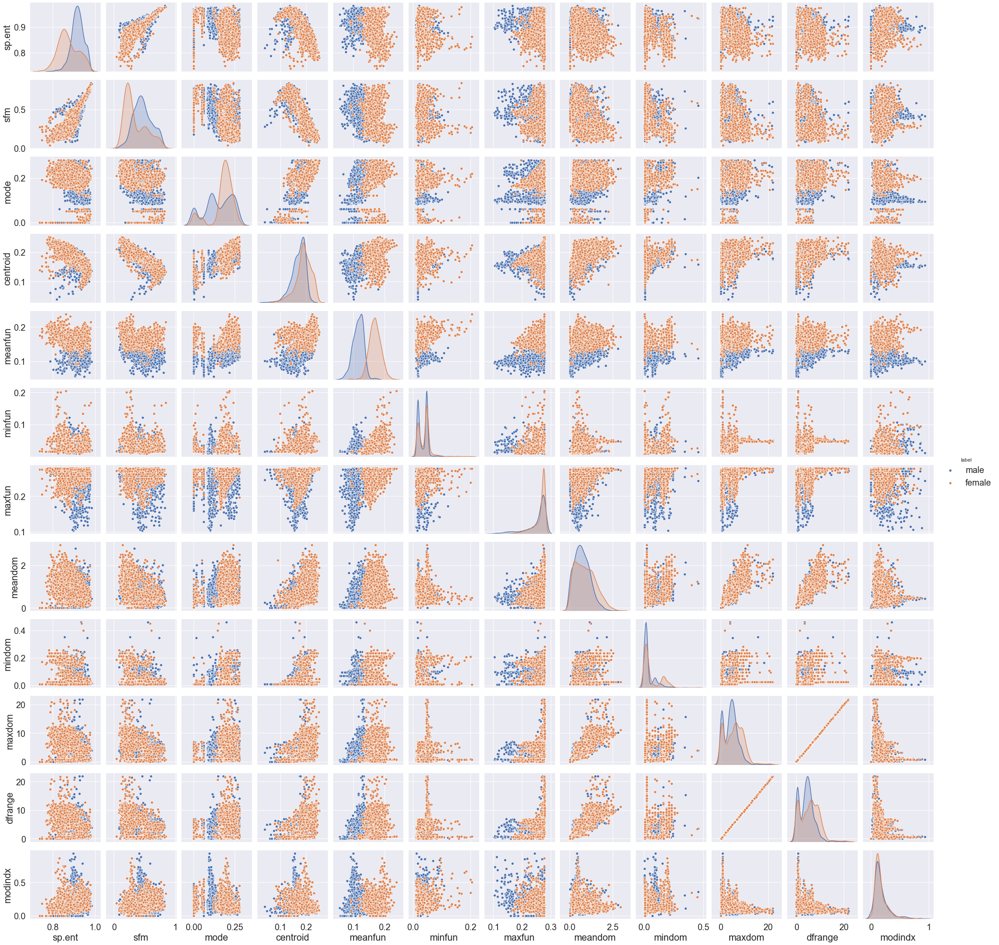

In [12]:
chars2 = ['sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
          'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx', 'label']
sns.pairplot(data[chars2], hue='label')

meanfun seems to be a really good predictor!
And it is not correlated with any other variable

<AxesSubplot:>

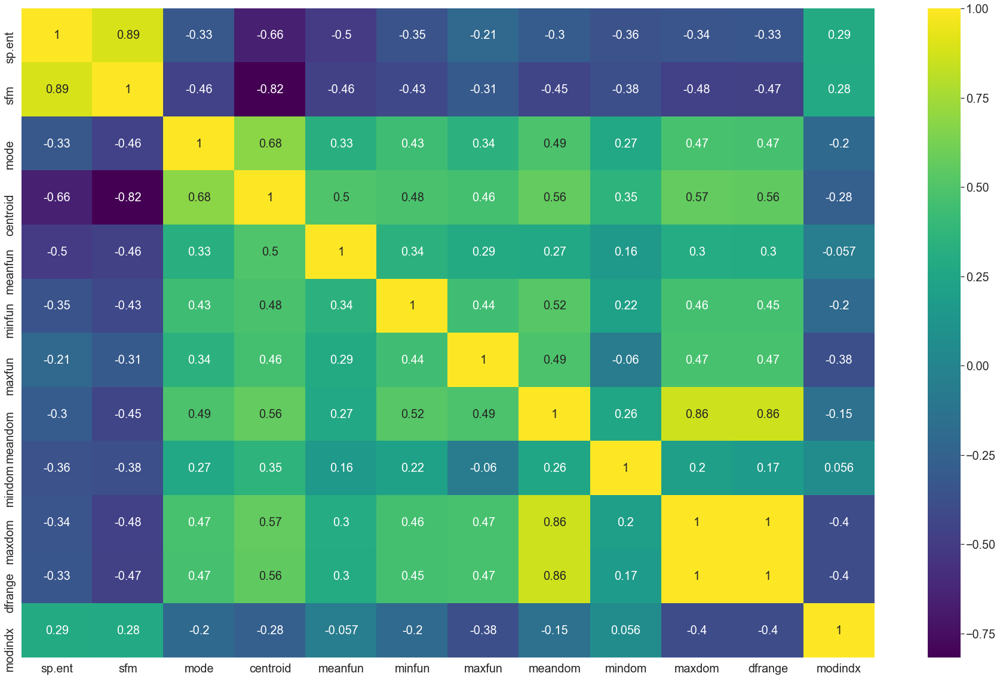

In [13]:
corr2 = data[chars2].corr(method='spearman')
plt.figure(figsize=(32, 20))
#sns.set_style('ticks')
sns.heatmap(corr2, cmap='viridis', annot=True, annot_kws={"size": 20})

Also, a lot of correlations here
- maxdom with dfrange (corr=1)
- both with meandom (corr=0.86)
- sp.ent + sfm + centroid

So, we can remove *sfm* and, say, *maxdom* and *dfrange*


*centroid* is perfectly correlated with *meanfreq* + *median*, *SD*, *Q25*, *Q75* and *IQR*

Then we can drop *centroid*

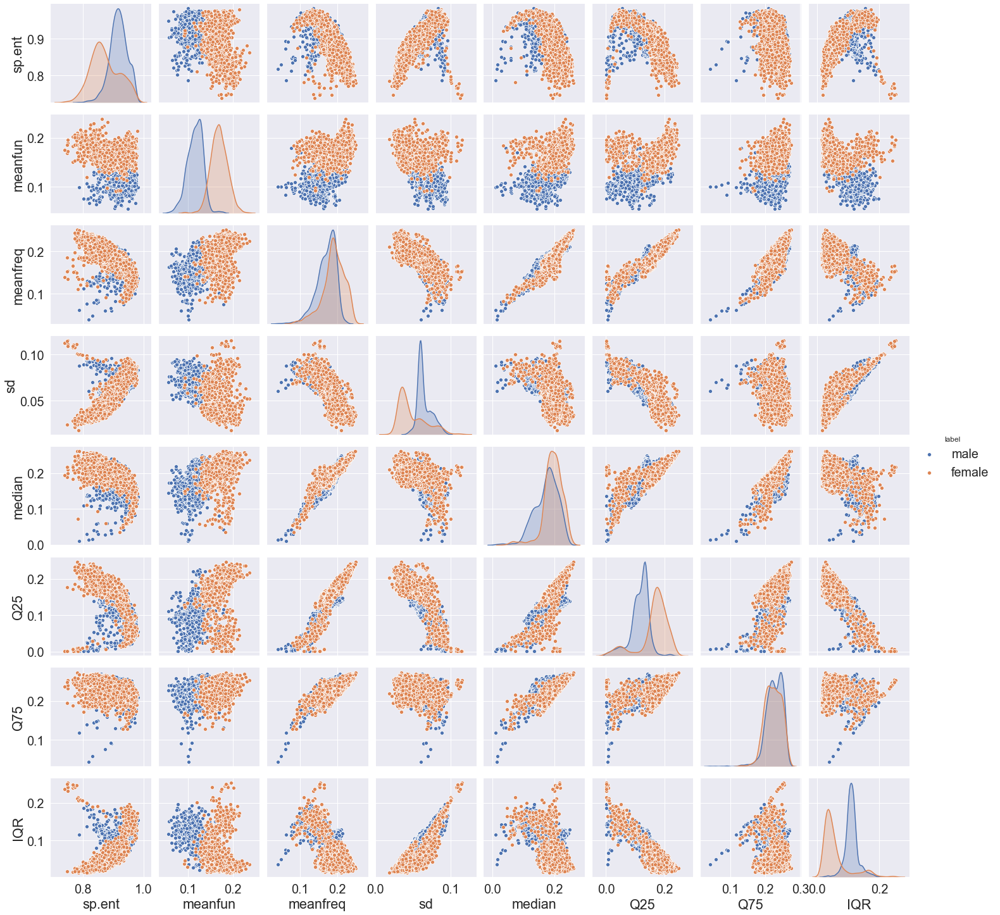

In [14]:
chars3 = ['sp.ent', 'meanfun', 'meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'label']
sns.pairplot(data[chars3], hue='label')

So, I will drop the following vars:
centroid, median, maxdom, dfrange, sfm, sd

# Quick tree with all variables

In [15]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn import tree
from sklearn.metrics import precision_score, recall_score, f1_score, plot_roc_curve, plot_precision_recall_curve, plot_confusion_matrix, accuracy_score

## Convert label to 1 and 0

In [16]:
data['label'] = data['label'].replace('male', '1')
data['label'] = data['label'].replace('female', '0')
data['label'] = data['label'].astype(int)

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-null   int6

## Split to train and test datasets

In [18]:
X = data.drop(['label'], axis=1)
Y = data.label

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.33, random_state = 42)

## Fit hyper-parameters and k-fold cross-validation with k=5

In [19]:
clf_rf = RandomForestClassifier(bootstrap=True, n_jobs=4, oob_score=False)
parameters_rf = {'n_estimators': [10, 20, 30, 40, 50, 100],
              'criterion': ['gini', 'entropy'],
              'max_depth': range(1,20),
              'min_samples_split': range(2, 10),
              'min_samples_leaf': range(1, 10),
              'min_impurity_decrease': [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2],
              'ccp_alpha': [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2]}


In [20]:
rand_search_cv_clf_rf = RandomizedSearchCV(clf_rf, parameters_rf,
                                           cv=5, n_iter=20, random_state=1)

In [21]:
rand_search_cv_clf_rf.fit(X_train, Y_train)
rand_search_cv_clf_rf.best_params_

{'n_estimators': 30,
 'min_samples_split': 7,
 'min_samples_leaf': 6,
 'min_impurity_decrease': 0.0,
 'max_depth': 8,
 'criterion': 'gini',
 'ccp_alpha': 0.0}

{'n_estimators': 30,
 'min_samples_split': 7,
 'min_samples_leaf': 6,
 'min_impurity_decrease': 0.0,
 'max_depth': 8,
 'criterion': 'gini',
 'ccp_alpha': 0.0}

In [22]:
best_clf = rand_search_cv_clf_rf.best_estimator_

### Prediction

In [23]:
Y_pred = best_clf.predict(X_test)

### Quality of prediction metrics and plots

In [24]:
def get_metrics(test_array, pred_array):
    accuracy = accuracy_score(test_array, pred_array)
    precision = precision_score(test_array, pred_array)
    recall = recall_score(test_array, pred_array)
    f_score = f1_score(test_array, pred_array)

    metrics= pd.DataFrame({'accuracy':[accuracy], 'precision':[precision],
                                'recall':[recall], 'f1':[f_score]})
    return metrics

metrics_df = get_metrics(Y_test, Y_pred)
metrics_df

,acc,prec,recall,f1
0,0.977055,0.981584,0.974406,0.977982


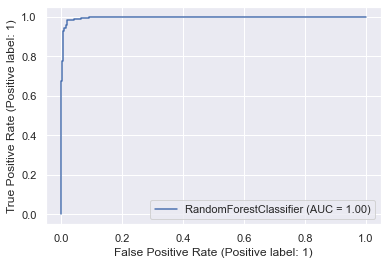

In [46]:
plot_roc_curve(best_clf, X_test, Y_test)

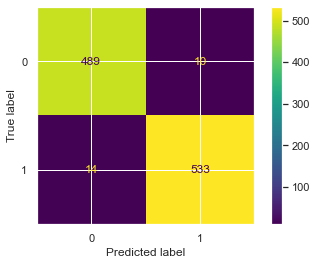

In [51]:
plot_confusion_matrix(best_clf, X_test, Y_test)

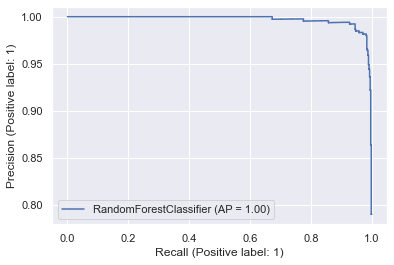

In [52]:
plot_precision_recall_curve(best_clf, X_test, Y_test)

### Feature importance
Correlated features 'split' the importance metrics

In [28]:
feature_importances = best_clf.feature_importances_
feature_importances_df = pd.DataFrame({'features': X_train.columns, 'importance': feature_importances})
feature_importances_df = feature_importances_df.sort_values('importance', ascending=False).reset_index(drop=True)
feature_importances_df

,features,importance
0,meanfun,0.409275
1,IQR,0.192204
2,sd,0.116172
3,Q25,0.102621
4,sfm,0.031786
5,sp.ent,0.028931
6,mode,0.025239
7,centroid,0.025079
8,median,0.008771
9,mindom,0.008379


[Text(0, 0, 'meanfun'),
 Text(1, 0, 'IQR'),
 Text(2, 0, 'sd'),
 Text(3, 0, 'Q25'),
 Text(4, 0, 'sfm'),
 Text(5, 0, 'sp.ent'),
 Text(6, 0, 'mode'),
 Text(7, 0, 'centroid'),
 Text(8, 0, 'median'),
 Text(9, 0, 'mindom'),
 Text(10, 0, 'skew'),
 Text(11, 0, 'minfun'),
 Text(12, 0, 'Q75'),
 Text(13, 0, 'meandom'),
 Text(14, 0, 'meanfreq'),
 Text(15, 0, 'maxdom'),
 Text(16, 0, 'kurt'),
 Text(17, 0, 'modindx'),
 Text(18, 0, 'dfrange'),
 Text(19, 0, 'maxfun')]

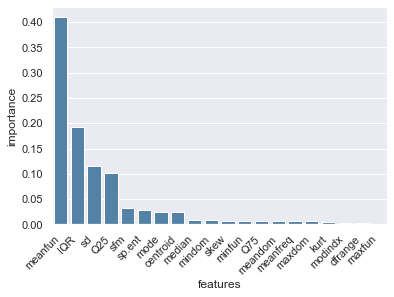

In [47]:
barplot = sns.barplot(x='features', y='importance',
                      data=feature_importances_df, color='steelblue')

barplot.set_xticklabels(
    barplot.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

# Tree without collinear vars

In [30]:
to_drop = ['centroid', 'median', 'maxdom', 'dfrange', 'sfm', 'sd']
Xd = data.drop(to_drop + ['label'], axis=1)
#Y = data.label

Xd_train, Xd_test, Yd_train, Yd_test = train_test_split(Xd, Y, test_size = 0.33, random_state = 42)


In [31]:
rand_search_cv_clf_rf_drop = RandomizedSearchCV(clf_rf, parameters_rf,
                                           cv=5, n_iter=20, random_state=1)

In [32]:
rand_search_cv_clf_rf_drop.fit(Xd_train, Yd_train)
rand_search_cv_clf_rf_drop.best_params_

{'n_estimators': 30,
 'min_samples_split': 7,
 'min_samples_leaf': 6,
 'min_impurity_decrease': 0.0,
 'max_depth': 8,
 'criterion': 'gini',
 'ccp_alpha': 0.0}

In [33]:
best_clf_drop = rand_search_cv_clf_rf_drop.best_estimator_

In [34]:
Yd_pred = best_clf_drop.predict(Xd_test)

In [35]:
metrics_df_drop = get_metrics(Yd_test, Yd_pred)
metrics_df_drop

,acc,prec,recall,f1
0,0.975143,0.976234,0.976234,0.976234


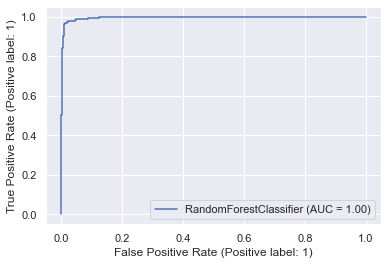

In [50]:
plot_roc_curve(best_clf_drop, Xd_test, Yd_test)

In [37]:
feature_importances_drop = best_clf_drop.feature_importances_
feature_importances_drop_df = pd.DataFrame({'features': Xd_train.columns, 'importance': feature_importances_drop})

feature_importances_drop_df = feature_importances_drop_df.sort_values('importance', ascending=False).reset_index(drop=True)
feature_importances_drop_df

,features,importance
0,meanfun,0.425016
1,IQR,0.214950
2,Q25,0.165012
3,sp.ent,0.062245
4,meanfreq,0.041312
5,mode,0.024402
6,skew,0.023669
7,Q75,0.010805
8,mindom,0.008614
9,meandom,0.007250


[Text(0, 0, 'meanfun'),
 Text(1, 0, 'IQR'),
 Text(2, 0, 'Q25'),
 Text(3, 0, 'sp.ent'),
 Text(4, 0, 'meanfreq'),
 Text(5, 0, 'mode'),
 Text(6, 0, 'skew'),
 Text(7, 0, 'Q75'),
 Text(8, 0, 'mindom'),
 Text(9, 0, 'meandom'),
 Text(10, 0, 'minfun'),
 Text(11, 0, 'modindx'),
 Text(12, 0, 'kurt'),
 Text(13, 0, 'maxfun')]

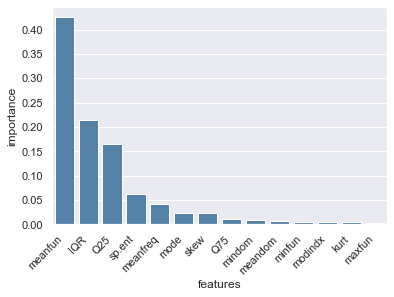

In [48]:
barplot = sns.barplot(x='features', y='importance',
            data=feature_importances_drop_df, color='steelblue')
barplot.set_xticklabels(
    barplot.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

As it could be predicted from the scatter plots, *meanfun* is the most important variable.
Also, removing collinear variables didn't improve performance of the model, but made computations faster.

# Logistic Regression

In [39]:
from sklearn.linear_model import LogisticRegression

In [40]:
lr = LogisticRegression(random_state=1, max_iter=1000, C=10)

lr.fit(Xd_train, Yd_train)

LogisticRegression(C=10, max_iter=1000, random_state=1)

In [41]:
Yd_lr_pred = lr.predict(Xd_test)


In [42]:
metrics_df_lr = get_metrics(Yd_test, Yd_lr_pred)
metrics_df_lr

,accuracy,precision,recall,f1
0,0.964627,0.956989,0.976234,0.966516


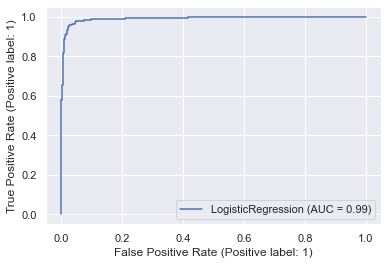

In [49]:
plot_roc_curve(lr, Xd_test, Yd_test)

With proper C parameter LR works almost as good as RF
